<a href="https://colab.research.google.com/github/yweslakarep123/Anime-Faces/blob/main/Anime_Faces_DCGAN.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
from google.colab import drive

In [2]:
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [3]:
import os
os.environ['KAGGLE_CONFIG_DIR'] = '/content'

In [4]:
!chmod 600 /content/kaggle.json

In [5]:
!kaggle datasets download -d soumikrakshit/anime-faces

 99% 436M/441M [00:04<00:00, 91.8MB/s]
100% 441M/441M [00:04<00:00, 94.9MB/s]


In [6]:
!pip install patool pyunpack

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 94.6/94.6 kB 3.1 MB/s eta 0:00:00


In [7]:
from pyunpack import Archive
zip_file_path = '/content/anime-faces.zip'
extract_directory = '/content/drive/MyDrive/Test_dataset'
# Buka dan ekstrak file ZIP menggunakan patool
Archive(zip_file_path).extractall(extract_directory)

# Output pesan jika ekstraksi selesai
print("Ekstraksi selesai.")

Ekstraksi selesai.


In [3]:
import tensorflow as tf
from tensorflow import keras
from keras.preprocessing.image import load_img, array_to_img
from keras.models import Sequential, Model
from keras import layers
from keras.optimizers import Adam
from keras.losses import BinaryCrossentropy

In [4]:
from tqdm.notebook import tqdm
import os

import numpy as np

In [5]:
IMG_DIR = '/content/drive/MyDrive/Test_dataset/data_anime_face'

In [6]:
paths = []
for img_name in os.listdir(IMG_DIR):
  path = os.path.join(IMG_DIR,img_name)
  paths.append(path)

In [8]:
paths.remove('/content/drive/MyDrive/Test_dataset/data_anime_face/data')

In [15]:
len(paths)

21551

In [9]:
train_img = [np.array(load_img(path)) for path in tqdm(paths)]
train_img = np.array(train_img)

  0%|          | 0/21551 [00:00<?, ?it/s]

In [43]:
train_img[0].shape

(64, 64, 3)

In [44]:
train_img.shape[0]

21551

In [10]:
train_img = train_img.reshape(train_img.shape[0], 64, 64, 3).astype('float32')

In [45]:
train_img.shape

(21551, 64, 64, 3)

In [11]:
train_img = (train_img-127.5)/127.5

In [ ]:
train_img[0]

In [12]:
random_noise_dim = 100
intitalized_weight = keras.initializers.RandomNormal(mean=0.0, stddev=0.02, seed=0)
color_channel_img = 3

In [45]:
8*8*512

32768

In [23]:
model = Sequential(name='generator')

# 1d random noise
model.add(layers.Dense(8 * 8 * 512, input_dim=random_noise_dim))
# model.add(layers.BatchNormalization())
model.add(layers.ReLU())

# convert 1d to 3d
model.add(layers.Reshape((8, 8, 512)))

# upsample to 16x16
model.add(layers.Conv2DTranspose(256, (4, 4), strides=(2, 2), padding='same', kernel_initializer=intitalized_weight))
# model.add(layers.BatchNormalization())
model.add(layers.ReLU())

# upsample to 32x32
model.add(layers.Conv2DTranspose(128, (4, 4), strides=(2, 2), padding='same', kernel_initializer=intitalized_weight))
# model.add(layers.BatchNormalization())
model.add(layers.ReLU())

# upsample to 64x64
model.add(layers.Conv2DTranspose(64, (4, 4), strides=(2, 2), padding='same', kernel_initializer=intitalized_weight))
# model.add(layers.BatchNormalization())
model.add(layers.ReLU())

model.add(layers.Conv2D(color_channel_img, (4, 4), padding='same', activation='tanh'))

generator = model
generator.summary()


Model: "generator"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_2 (Dense)             (None, 32768)             3309568   
                                                                 
 re_lu_4 (ReLU)              (None, 32768)             0         
                                                                 
 reshape_1 (Reshape)         (None, 8, 8, 512)         0         
                                                                 
 conv2d_transpose_3 (Conv2D  (None, 16, 16, 256)       2097408   
 Transpose)                                                      
                                                                 
 re_lu_5 (ReLU)              (None, 16, 16, 256)       0         
                                                                 
 conv2d_transpose_4 (Conv2D  (None, 32, 32, 128)       524416    
 Transpose)                                              

In [24]:
model = Sequential(name='discriminator')
input_shape = (64, 64, 3)
alpha = 0.2

# create conv layers
model.add(layers.Conv2D(64, (4, 4), strides=(2, 2), padding='same', input_shape=input_shape))
model.add(layers.BatchNormalization())
model.add(layers.LeakyReLU(alpha=alpha))

model.add(layers.Conv2D(128, (4, 4), strides=(2, 2), padding='same', input_shape=input_shape))
model.add(layers.BatchNormalization())
model.add(layers.LeakyReLU(alpha=alpha))

model.add(layers.Conv2D(128, (4, 4), strides=(2, 2), padding='same', input_shape=input_shape))
model.add(layers.BatchNormalization())
model.add(layers.LeakyReLU(alpha=alpha))

model.add(layers.Flatten())
model.add(layers.Dropout(0.3))

# output class
model.add(layers.Dense(1, activation='sigmoid'))

discriminator = model
discriminator.summary()

Model: "discriminator"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_5 (Conv2D)           (None, 32, 32, 64)        3136      
                                                                 
 batch_normalization_3 (Bat  (None, 32, 32, 64)        256       
 chNormalization)                                                
                                                                 
 leaky_re_lu_3 (LeakyReLU)   (None, 32, 32, 64)        0         
                                                                 
 conv2d_6 (Conv2D)           (None, 16, 16, 128)       131200    
                                                                 
 batch_normalization_4 (Bat  (None, 16, 16, 128)       512       
 chNormalization)                                                
                                                                 
 leaky_re_lu_4 (LeakyReLU)   (None, 16, 16, 128)     

In [32]:
class DCGAN(keras.Model):
    def __init__(self, generator, discriminator, latent_dim):
        super().__init__()
        self.generator = generator
        self.discriminator = discriminator
        self.latent_dim = latent_dim
        self.g_loss_metric = keras.metrics.Mean(name='g_loss')
        self.d_loss_metric = keras.metrics.Mean(name='d_loss')

    @property
    def metrics(self):
        return [self.g_loss_metric, self.d_loss_metric]

    def compile(self, g_optimizer, d_optimizer, loss_fn):
        super(DCGAN, self).compile()
        self.g_optimizer = g_optimizer
        self.d_optimizer = d_optimizer
        self.loss_fn = loss_fn

    def train_step(self, real_images):
        # get batch size from the data
        batch_size = tf.shape(real_images)[0]
        # generate random noise
        random_noise = tf.random.normal(shape=(batch_size, self.latent_dim))

        # train the discriminator with real (1) and fake (0) images
        with tf.GradientTape() as tape:
            # compute loss on real images
            pred_real = self.discriminator(real_images, training=True)
            # generate real image labels
            real_labels = tf.ones((batch_size, 1))
            # label smoothing
            real_labels += 0.05 * tf.random.uniform(tf.shape(real_labels))
            d_loss_real = self.loss_fn(real_labels, pred_real)

            # compute loss on fake images
            fake_images = self.generator(random_noise)
            pred_fake = self.discriminator(fake_images, training=True)
            # generate fake labels
            fake_labels = tf.zeros((batch_size, 1))
            d_loss_fake = self.loss_fn(fake_labels, pred_fake)

            # total discriminator loss
            d_loss = (d_loss_real + d_loss_fake) / 2

        # compute discriminator gradients
        gradients = tape.gradient(d_loss, self.discriminator.trainable_variables)
        # update the gradients
        self.d_optimizer.apply_gradients(zip(gradients, self.discriminator.trainable_variables))


        # train the generator model
        labels = tf.ones((batch_size, 1))
        # generator want discriminator to think that fake images are real
        with tf.GradientTape() as tape:
            # generate fake images from generator
            fake_images = self.generator(random_noise, training=True)
            # classify images as real or fake
            pred_fake = self.discriminator(fake_images, training=True)
            # compute loss
            g_loss = self.loss_fn(labels, pred_fake)

        # compute gradients
        gradients = tape.gradient(g_loss, self.generator.trainable_variables)
        # update the gradients
        self.g_optimizer.apply_gradients(zip(gradients, self.generator.trainable_variables))

        # update states for both models
        self.d_loss_metric.update_state(d_loss)
        self.g_loss_metric.update_state(g_loss)

        return {'d_loss': self.d_loss_metric.result(), 'g_loss': self.g_loss_metric.result()}

In [33]:
import matplotlib.pyplot as plt


In [39]:
class DCGANMonitor(keras.callbacks.Callback):
  def __init__(self, banyak_gambar=25, random_noise_dim=100):
    self.banyak_gambar = banyak_gambar
    self.random_noise_dim = random_noise_dim
    self.noise = tf.random.normal([25, random_noise_dim])

  def on_epoch_end(self, epoch, logs=None):
    generator_gambar = self.model.generator(self.noise)
    generator_gambar = (generator_gambar*127.5)/127.5
    generator_gambar.numpy()

    fig = plt.figure(figsize=(8,8))
    for i in range(self.banyak_gambar):
      plt.subplot(5,5,i+1)
      img = array_to_img(generator_gambar[i])
      plt.imshow(img)
      plt.axis('off')
    plt.show()

  def on_train_end(self, logs=None):
    self.model_generator.save('generator.h5')

In [40]:
dcgan = DCGAN(generator=generator, discriminator=discriminator, latent_dim=random_noise_dim)

In [41]:
generator_learning_rate = 0.0003
discriminator_learning_rate = 0.0001

In [42]:
dcgan.compile(g_optimizer=Adam(learning_rate=generator_learning_rate, beta_1=0.5), d_optimizer=Adam(learning_rate=discriminator_learning_rate, beta_1=0.5), loss_fn = BinaryCrossentropy())

Epoch 1/50
673/674 [============================>.] - ETA: 0s - d_loss: 0.7998 - g_loss: 1.5201

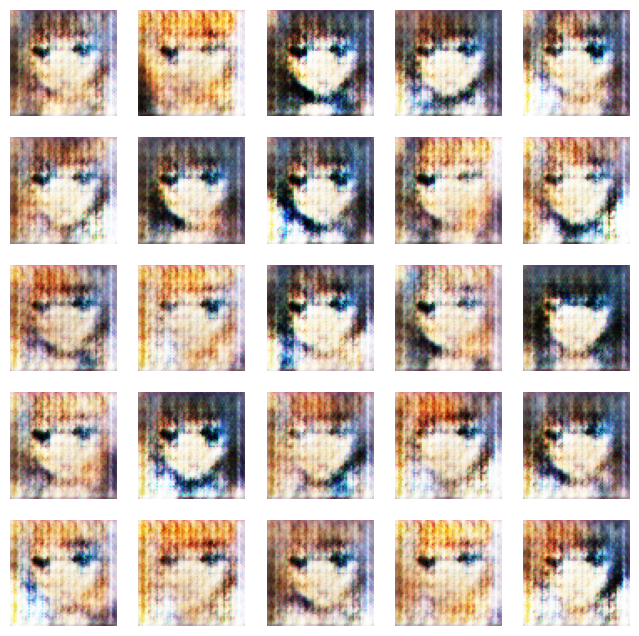

674/674 [==============================] - 50s 67ms/step - d_loss: 0.7999 - g_loss: 1.5194
Epoch 2/50
673/674 [============================>.] - ETA: 0s - d_loss: 0.7568 - g_loss: 0.9259

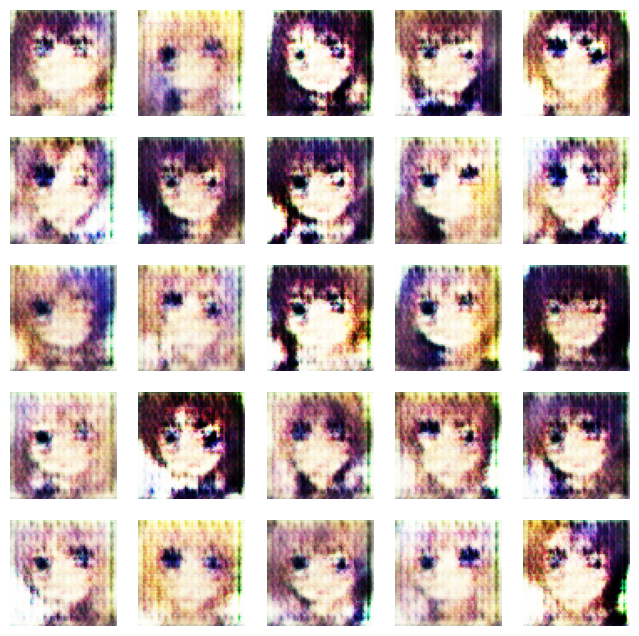

674/674 [==============================] - 45s 67ms/step - d_loss: 0.7570 - g_loss: 0.9259
Epoch 3/50
673/674 [============================>.] - ETA: 0s - d_loss: 0.7322 - g_loss: 0.9420

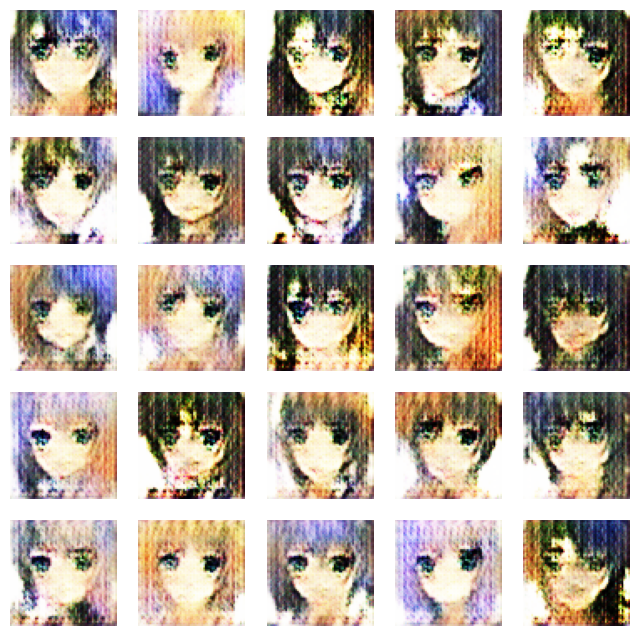

674/674 [==============================] - 45s 67ms/step - d_loss: 0.7321 - g_loss: 0.9419
Epoch 4/50
673/674 [============================>.] - ETA: 0s - d_loss: 0.7509 - g_loss: 0.8550

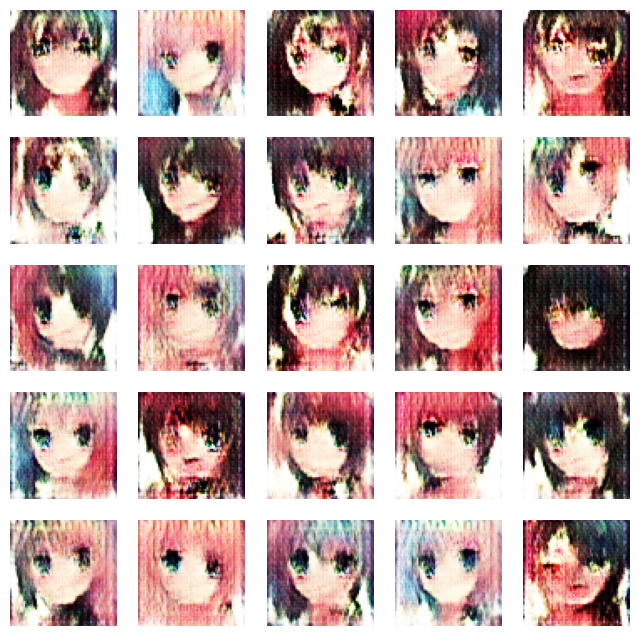

674/674 [==============================] - 45s 67ms/step - d_loss: 0.7508 - g_loss: 0.8551
Epoch 5/50
673/674 [============================>.] - ETA: 0s - d_loss: 0.7298 - g_loss: 0.8025

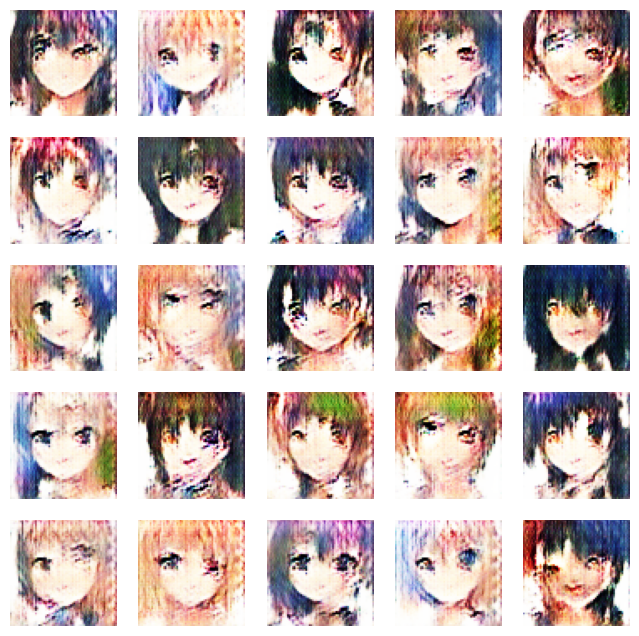

674/674 [==============================] - 46s 68ms/step - d_loss: 0.7297 - g_loss: 0.8025
Epoch 6/50
673/674 [============================>.] - ETA: 0s - d_loss: 0.7260 - g_loss: 0.7737

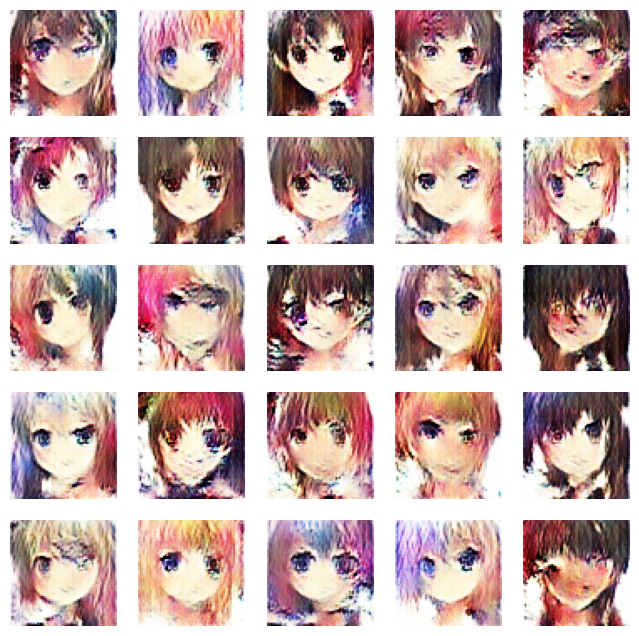

674/674 [==============================] - 45s 67ms/step - d_loss: 0.7259 - g_loss: 0.7738
Epoch 7/50
673/674 [============================>.] - ETA: 0s - d_loss: 0.7137 - g_loss: 0.7768

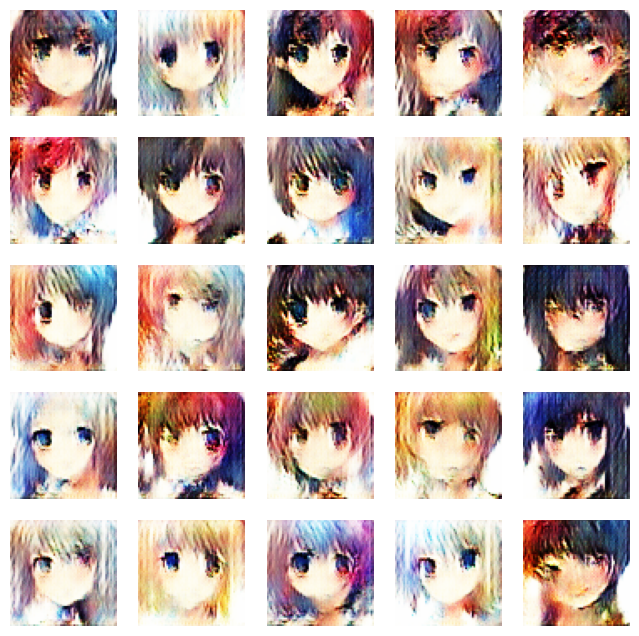

674/674 [==============================] - 46s 68ms/step - d_loss: 0.7137 - g_loss: 0.7769
Epoch 8/50
673/674 [============================>.] - ETA: 0s - d_loss: 0.7173 - g_loss: 0.7794

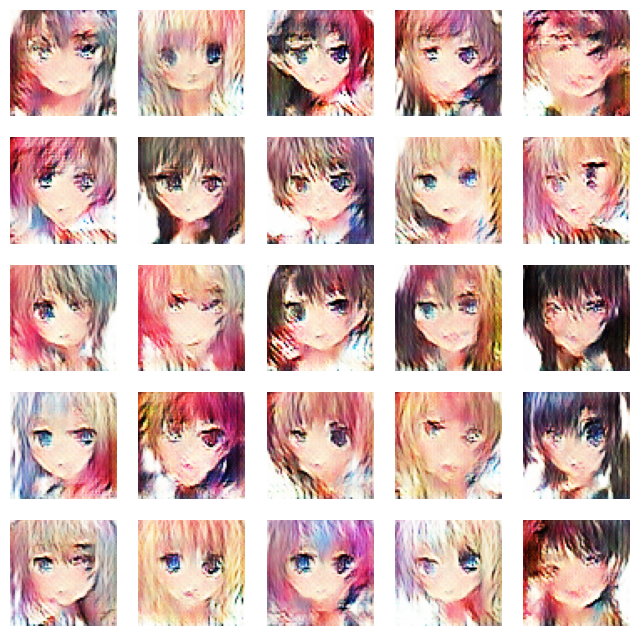

674/674 [==============================] - 46s 68ms/step - d_loss: 0.7173 - g_loss: 0.7794
Epoch 9/50
673/674 [============================>.] - ETA: 0s - d_loss: 0.7239 - g_loss: 0.7336

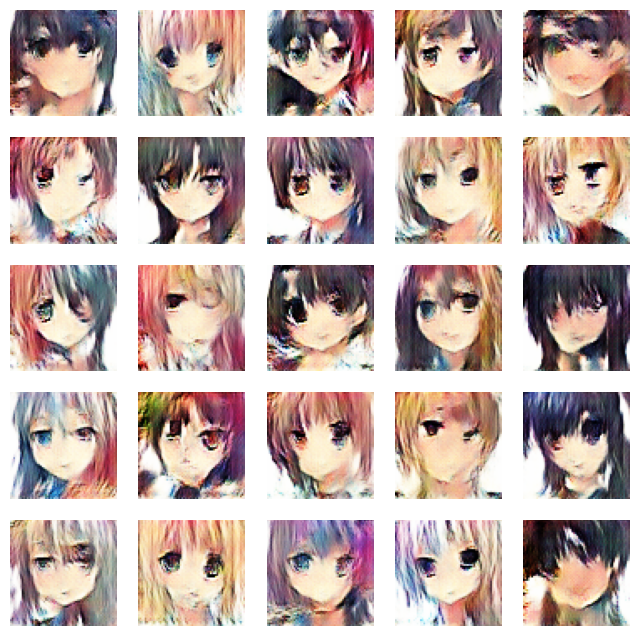

674/674 [==============================] - 46s 68ms/step - d_loss: 0.7239 - g_loss: 0.7338
Epoch 10/50
673/674 [============================>.] - ETA: 0s - d_loss: 0.7205 - g_loss: 0.7185

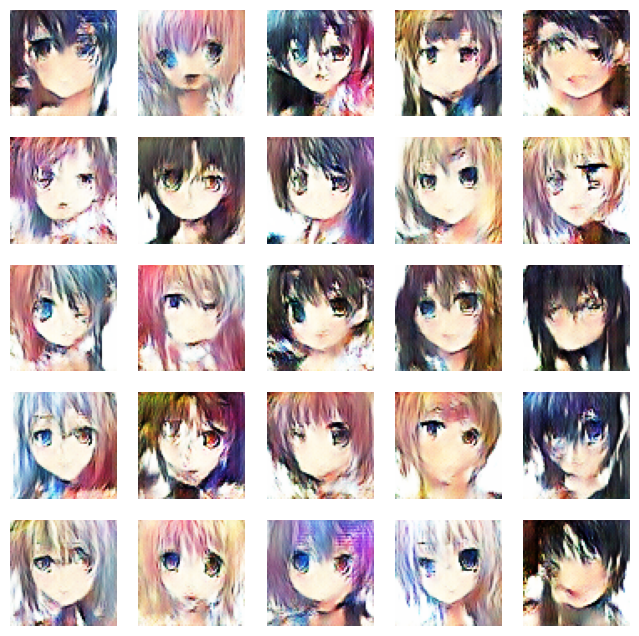

674/674 [==============================] - 46s 68ms/step - d_loss: 0.7205 - g_loss: 0.7185
Epoch 11/50
673/674 [============================>.] - ETA: 0s - d_loss: 0.7170 - g_loss: 0.7129

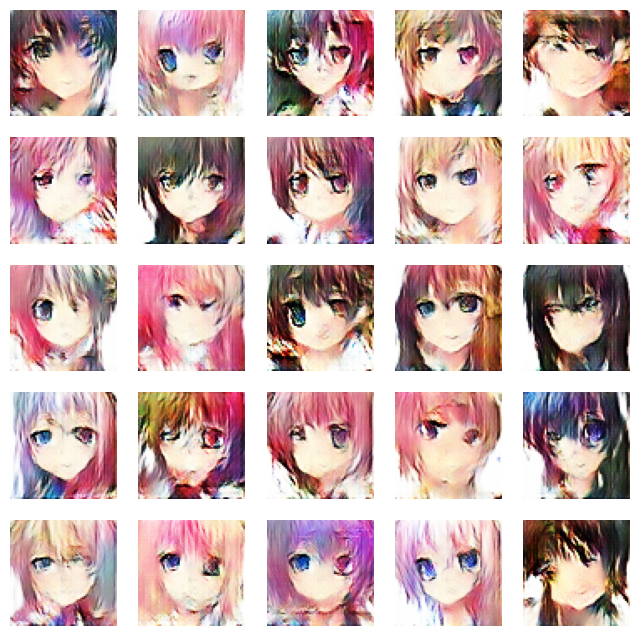

674/674 [==============================] - 46s 68ms/step - d_loss: 0.7171 - g_loss: 0.7130
Epoch 12/50
673/674 [============================>.] - ETA: 0s - d_loss: 0.7144 - g_loss: 0.7131

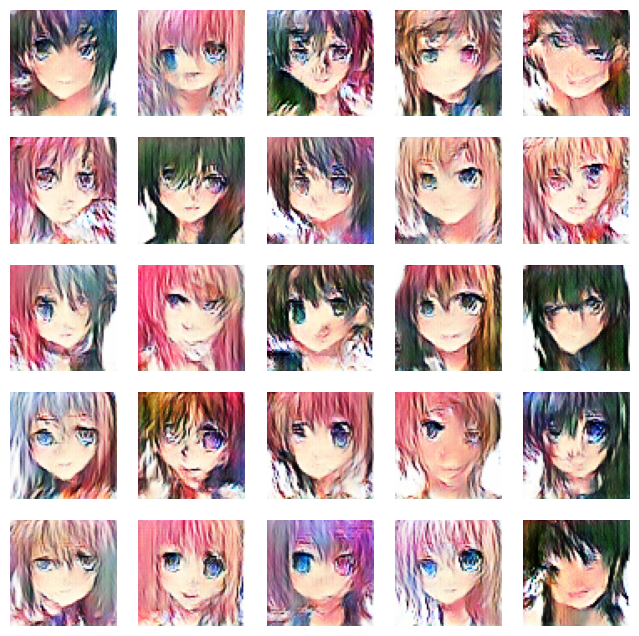

674/674 [==============================] - 46s 68ms/step - d_loss: 0.7144 - g_loss: 0.7132
Epoch 13/50
673/674 [============================>.] - ETA: 0s - d_loss: 0.7121 - g_loss: 0.7155

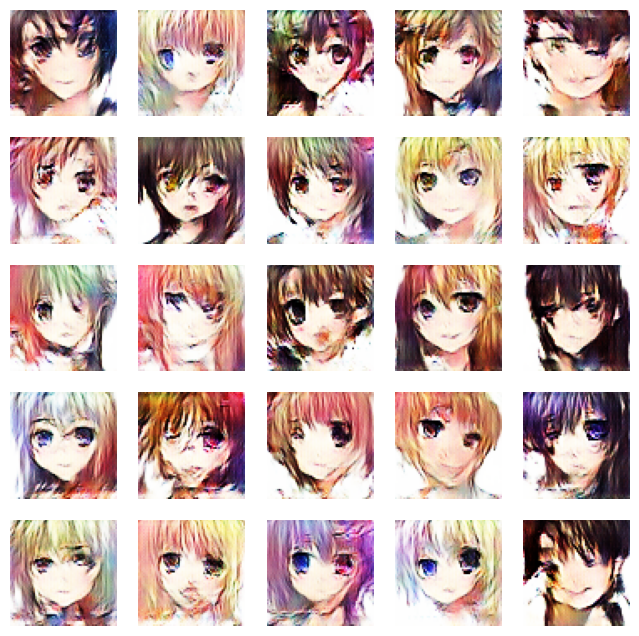

674/674 [==============================] - 46s 68ms/step - d_loss: 0.7121 - g_loss: 0.7156
Epoch 14/50
673/674 [============================>.] - ETA: 0s - d_loss: 0.7091 - g_loss: 0.7223

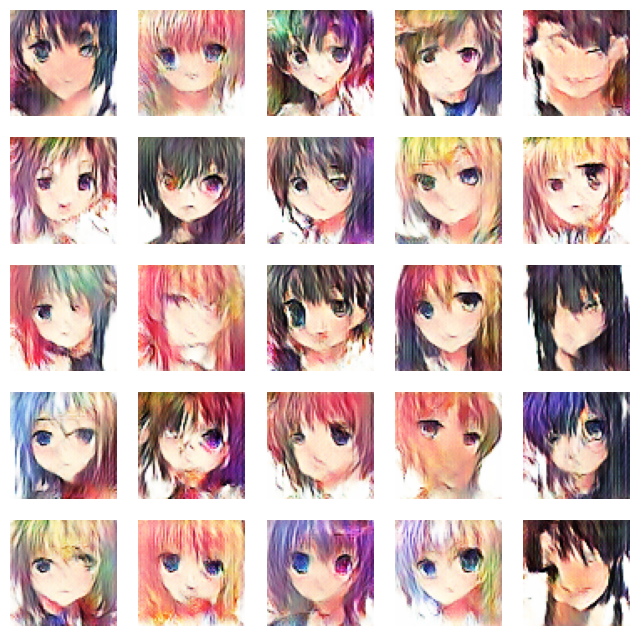

674/674 [==============================] - 46s 69ms/step - d_loss: 0.7091 - g_loss: 0.7223
Epoch 15/50
127/674 [====>.........................] - ETA: 36s - d_loss: 0.7077 - g_loss: 0.7204

In [ ]:
number_of_epochs = 50
dcgan.fit(train_img, epochs=number_of_epochs, callbacks=[DCGANMonitor()])

In [ ]:
noise = tf.random.normal([1, 100])
fig = plt.figure(figsize=(3, 3))
# generate the image from noise
g_img = dcgan.generator(noise)
# denormalize the image
g_img = (g_img * 127.5) + 127.5
g_img.numpy()
img = array_to_img(g_img[0])
plt.imshow(img)
plt.axis('off')
# plt.savefig('epoch_{:03d}.png'.format(epoch))
plt.show()